In [1]:
from modeling_utils import load_model, \
                           evaluate_model

from plot_utils import plot_amplitude_phase_fully_connected_prediction_from_electric_field

from data_utils import load_validation_data, load_numpy_data

from psf_constants import PROCESSED_TRAIN_2M_ZERNIKE_OUTPUT_FLUXES_FILE_PREFIX, \
                          PROCESSED_TRAIN_2M_ZERNIKE_COMPLEX_FIELDS_FILE_PREFIX, \
                          PROCESSED_VALIDATION_2M_ZERNIKE_OUTPUT_FLUXES_FILE_PATH, \
                          PROCESSED_VALIDATION_2M_ZERNIKE_COMPLEX_FIELDS_FILE_PATH, \
                          VALIDATION_2M_ZERNIKE_COMPLEX_FIELDS_FILE_PATH

2024-05-27 16:12:16.392521: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-27 16:12:17.083585: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-27 16:12:17.083776: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-27 16:12:17.176068: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-27 16:12:17.370982: I tensorflow/core/platform/cpu_feature_guar

In [2]:
model_name = "SuperBigZernike2MFC70000-1"

In [3]:
model = load_model(model_name, 
                   psf_model=True)

2024-05-27 16:13:30.084281: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-05-27 16:13:30.478180: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-05-27 16:13:30.479075: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

In [4]:
validation_fluxes_array = load_numpy_data(PROCESSED_VALIDATION_2M_ZERNIKE_OUTPUT_FLUXES_FILE_PATH)
validation_electric_fields_array = load_numpy_data(PROCESSED_VALIDATION_2M_ZERNIKE_COMPLEX_FIELDS_FILE_PATH)

In [5]:
import random

In [6]:
rs = validation_electric_fields_array[0].reshape(2, 128, 128)

In [7]:
rs = rs[0] + 1j*rs[1]

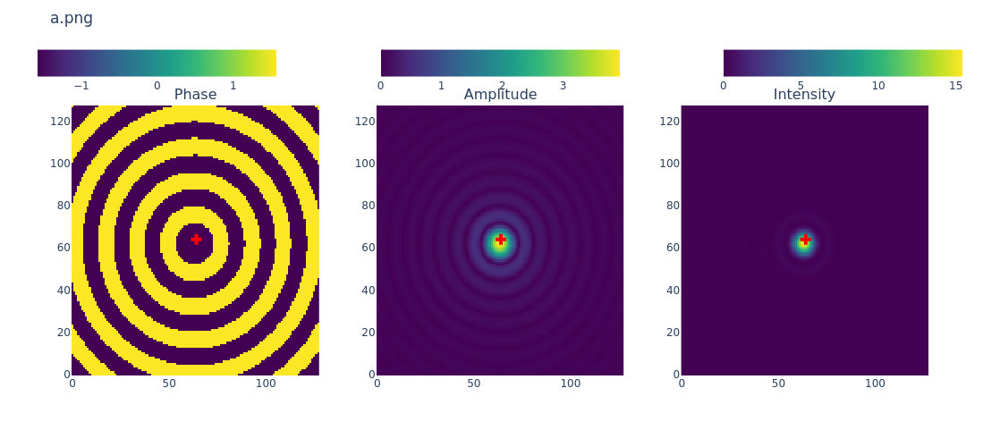

In [8]:
from plot_utils import plot_amplitude_phase_intensity
plot_amplitude_phase_intensity(rs, title="a.png")

1/1 [==============================] - 0s 398ms/step


2024-04-22 15:15:53.303636: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


[[-1.57079637 -1.57079625 -1.57079625 ... -1.57079625 -1.57079625
  -1.57079637]
 [-1.57079637 -1.57079625 -1.57079625 ... -1.57079625 -1.57079625
  -1.57079625]
 [-1.57079637 -1.57079625 -1.57079625 ... -1.57079637 -1.57079637
  -1.57079637]
 ...
 [ 1.57079637  1.57079637  1.57079637 ... -1.57079625  1.57079637
   1.57079625]
 [ 1.57079637  1.57079637  1.57079637 ...  1.57079625  1.57079637
   1.57079625]
 [ 1.57079637  1.57079637  1.57079637 ...  1.57079625  1.57079637
   1.57079625]]


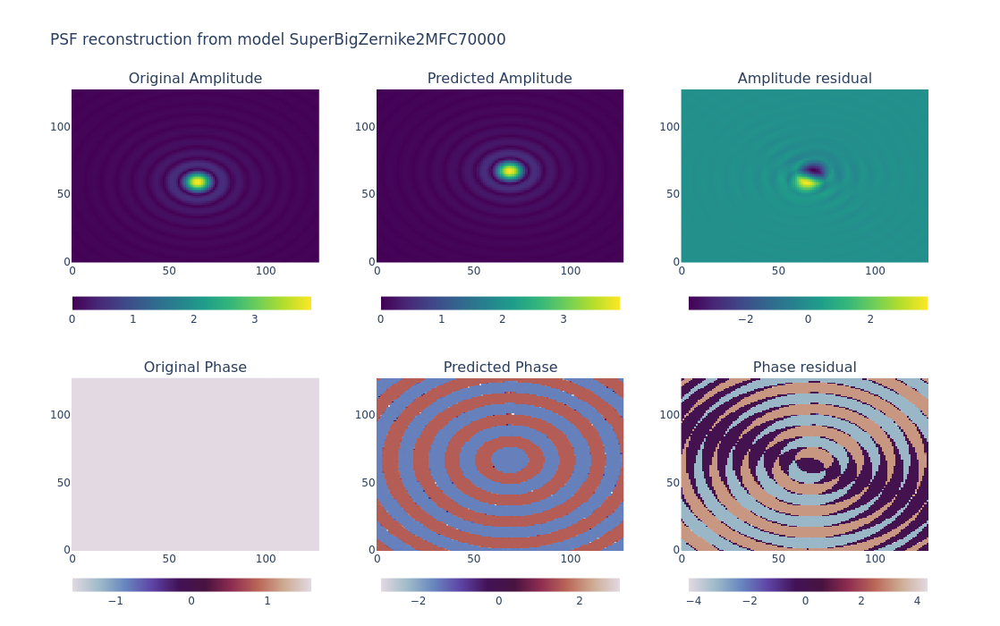

In [9]:
n = random.randint(0, len(validation_fluxes_array)-1)
plot_amplitude_phase_fully_connected_prediction_from_electric_field(model,
                                                                    validation_fluxes_array[n], 
                                                                    validation_electric_fields_array[n],
                                                                    log_scale=False,
                                                                    save_image=False)

1/1 [==============================] - 0s 40ms/step
[[-1.57079625 -1.57079637 -1.57079625 ... -1.57079637 -1.57079637
  -1.57079637]
 [-1.57079625 -1.57079637 -1.57079625 ... -1.57079637 -1.57079637
  -1.57079637]
 [-1.57079625 -1.57079637 -1.57079637 ... -1.57079637 -1.57079637
  -1.57079637]
 ...
 [-1.57079637 -1.57079625 -1.57079637 ...  1.57079625  1.57079625
   1.57079625]
 [-1.57079637 -1.57079637 -1.57079625 ...  1.57079625  1.57079625
   1.57079625]
 [ 1.57079625 -1.57079637 -1.57079625 ...  1.57079625  1.57079625
   1.57079625]]


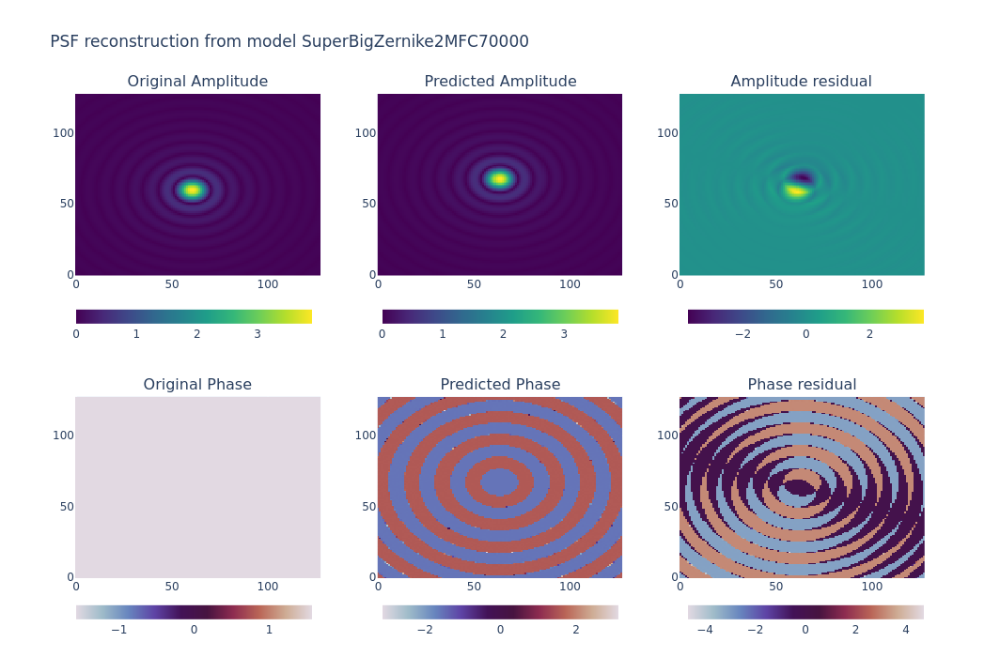

In [10]:
n = random.randint(0, len(validation_fluxes_array)-1)
plot_amplitude_phase_fully_connected_prediction_from_electric_field(model,
                                                                    validation_fluxes_array[n], 
                                                                    validation_electric_fields_array[n],
                                                                    log_scale=False,
                                                                    save_image=False)

In [12]:
evaluate_model(model,
               validation_fluxes_array,
               validation_electric_fields_array)

2024-04-22 15:16:13.449007: W external/local_tsl/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.22GiB (rounded to 1310720000)requested by op _EagerConst
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2024-04-22 15:16:13.449116: I external/local_tsl/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2024-04-22 15:16:13.449151: I external/local_tsl/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 24, Chunks in use: 24. 6.0KiB allocated for chunks. 6.0KiB in use in bin. 200B client-requested in use in bin.
2024-04-22 15:16:13.449174: I external/local_tsl/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 0, Chunks in use: 0. 0B allocated for chunks. 0B in use in bin. 0B client-requested in use in bin.
2024-04-22 15:16:13.449195: I external/

InternalError: Failed copying input tensor from /job:localhost/replica:0/task:0/device:CPU:0 to /job:localhost/replica:0/task:0/device:GPU:0 in order to run _EagerConst: Dst tensor is not initialized.